Installing log Files


In [1]:
# installation of library pm4py
%pip install pm4py

Note: you may need to restart the kernel to use updated packages.


Import Library


In [2]:
import pm4py
import tempfile
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from pm4py.objects.conversion.log import converter as log_converter
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualizer
from pm4py.visualization.petri_net import visualizer as pn_visualizer
from IPython.display import Image
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.algo.discovery.alpha import algorithm as alpha_mine

Read file Csv

In [3]:
df=pm4py.read_xes('Road_Traffic_Fine_Management_Process.xes')
log_df=pm4py.convert_to_dataframe(df)
log_df

parsing log, completed traces ::   0%|          | 0/150370 [00:00<?, ?it/s]

,amount,org:resource,dismissal,concept:name,vehicleClass,totalPaymentAmount,lifecycle:transition,time:timestamp,article,points,case:concept:name,expense,notificationType,lastSent,paymentAmount,matricola
0,35.0,561,NIL,Create Fine,A,0.0,complete,2006-07-24 00:00:00+00:00,157.0,0.0,A1,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,Send Fine,NaN,NaN,complete,2006-12-05 00:00:00+00:00,NaN,NaN,A1,11.00,NaN,NaN,NaN,NaN
2,35.0,561,NIL,Create Fine,A,0.0,complete,2006-08-02 00:00:00+00:00,157.0,0.0,A100,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,Send Fine,NaN,NaN,complete,2006-12-12 00:00:00+00:00,NaN,NaN,A100,11.00,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,Insert Fine Notification,NaN,NaN,complete,2007-01-15 00:00:00+00:00,NaN,NaN,A100,NaN,P,P,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561465,131.0,25,NIL,Create Fine,A,0.0,complete,2002-09-07 00:00:00+00:00,142.0,0.0,V9999,NaN,NaN,NaN,NaN,NaN
561466,NaN,NaN,NaN,Send Fine,NaN,NaN,complete,2002-10-25 00:00:00+00:00,NaN,NaN,V9999,15.16,NaN,NaN,NaN,NaN
561467,NaN,NaN,NaN,Insert Fine Notification,NaN,NaN,complete,2002-11-04 00:00:00+00:00,NaN,NaN,V9999,NaN,P,N,NaN,NaN
561468,262.0,NaN,NaN,Add penalty,NaN,NaN,complete,2003-01-03 00:00:00+00:00,NaN,NaN,V9999,NaN,NaN,NaN,NaN,NaN


Print Number Event and Cases 

In [4]:
num_events = len(log_df)
num_cases = len(log_df['case:concept:name'].unique())
print("Number of events: {}\nNumber of cases: {}".format(num_events, num_cases))
start_activities = pm4py.get_start_activities(log_df)
end_activities = pm4py.get_end_activities(log_df)
print("Start activities: {}\nEnd activities: {}".format(start_activities, end_activities))

Number of events: 561470
Number of cases: 150370
Start activities: {'Create Fine': 150370}
End activities: {'Send Fine': 20755, 'Send for Credit Collection': 58997, 'Payment': 67201, 'Send Appeal to Prefecture': 3144, 'Appeal to Judge': 134, 'Notify Result Appeal to Offender': 86, 'Receive Result Appeal from Prefecture': 53}


Drop Duplicate

In [5]:
log_df = log_df.drop_duplicates()
log_df.reset_index(drop=True, inplace=True)
len(log_df)

561470

Case Duration

In [6]:
case_durations = log_df.groupby('case:concept:name').agg(\
Events=('case:concept:name', 'count'),\
FirstOccurence=('time:timestamp', lambda x: x.min()),
LastOccurence=('time:timestamp', lambda x: x.max()),
Duration=('time:timestamp', lambda x: x.max() - x.min())
)
case_durations

,Events,FirstOccurence,LastOccurence,Duration
case:concept:name,,,,
A1,2,2006-07-24 00:00:00+00:00,2006-12-05 00:00:00+00:00,134 days
A100,5,2006-08-02 00:00:00+00:00,2009-03-30 00:00:00+00:00,971 days
A10000,5,2007-03-09 00:00:00+00:00,2008-09-09 00:00:00+00:00,550 days
A10001,6,2007-03-19 00:00:00+00:00,2007-09-24 00:00:00+00:00,189 days
A10004,5,2007-03-20 00:00:00+00:00,2009-03-30 00:00:00+00:00,741 days
...,...,...,...,...
V9995,5,2002-09-07 00:00:00+00:00,2004-01-10 00:00:00+00:00,490 days
V9996,3,2002-09-07 00:00:00+00:00,2002-11-06 00:00:00+00:00,60 days
V9997,5,2002-09-07 00:00:00+00:00,2004-01-10 00:00:00+00:00,490 days


Columns Names 

In [7]:
# Get the column names
columns = log_df.columns

# Print all the columns
for column in columns:
    print(column)

amount
org:resource
dismissal
concept:name
vehicleClass
totalPaymentAmount
lifecycle:transition
time:timestamp
article
points
case:concept:name
expense
notificationType
lastSent
paymentAmount
matricola


Get variants 

In [8]:
variants = pm4py.get_variants(log_df)
variants = sorted(variants.items(), key=lambda x: x[1],reverse=True)
variants

[(('Create Fine',
   'Send Fine',
   'Insert Fine Notification',
   'Add penalty',
   'Send for Credit Collection'),
  56482),
 (('Create Fine', 'Payment'), 46371),
 (('Create Fine', 'Send Fine'), 20385),
 (('Create Fine',
   'Send Fine',
   'Insert Fine Notification',
   'Add penalty',
   'Payment'),
  9520),
 (('Create Fine',
   'Send Fine',
   'Insert Fine Notification',
   'Add penalty',
   'Payment',
   'Payment'),
  3736),
 (('Create Fine',
   'Send Fine',
   'Insert Fine Notification',
   'Payment',
   'Add penalty',
   'Payment'),
  3301),
 (('Create Fine', 'Send Fine', 'Payment'), 3131),
 (('Create Fine',
   'Send Fine',
   'Insert Fine Notification',
   'Insert Date Appeal to Prefecture',
   'Add penalty',
   'Send Appeal to Prefecture'),
  2497),
 (('Create Fine',
   'Send Fine',
   'Insert Fine Notification',
   'Add penalty',
   'Payment',
   'Send for Credit Collection'),
  1515),
 (('Create Fine',
   'Send Fine',
   'Insert Fine Notification',
   'Payment',
   'Add penal

Plot Variants

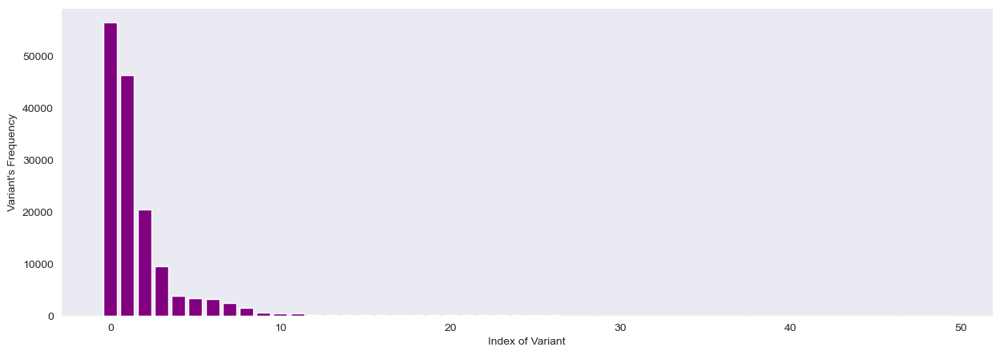

In [9]:
values = [item[1] for item in variants[:50]]
plt.figure(figsize=(15, 5))
plt.grid()
plt.xlabel('Index of Variant')
plt.ylabel('Variant\'s Frequency')
plt.bar(range(len(values)), values, color='purple')
plt.show()

activity frequency we compute frequency of activities:

In [10]:
frequency = log_df["concept:name"].value_counts().reset_index()
frequency.columns = ["concept:name", "Frequency"]
total = frequency["Frequency"].sum()
frequency["Percentage"] = frequency["Frequency"] / total * 100
frequency.index = frequency.index + 1
frequency[:20]

,concept:name,Frequency,Percentage
1,Create Fine,150370,26.781484
2,Send Fine,103987,18.520491
3,Insert Fine Notification,79860,14.223378
4,Add penalty,79860,14.223378
5,Payment,77601,13.821041
6,Send for Credit Collection,59013,10.510446
7,Insert Date Appeal to Prefecture,4188,0.745899
8,Send Appeal to Prefecture,4141,0.737528
9,Receive Result Appeal from Prefecture,999,0.177926
10,Notify Result Appeal to Offender,896,0.159581


It is a good consideration to check the list of start and end activities. we can use this list to detect some anomalies and use it during filtering phase:

In [11]:
log_start = pm4py.get_start_activities(df)
log_end = pm4py.get_end_activities(df)

In [12]:
log_start

{'Create Fine': 150370}

In [13]:
log_end

{'Send Fine': 20755,
 'Send for Credit Collection': 58997,
 'Payment': 67201,
 'Send Appeal to Prefecture': 3144,
 'Appeal to Judge': 134,
 'Notify Result Appeal to Offender': 86,
 'Receive Result Appeal from Prefecture': 53}

Plot Category Frequency

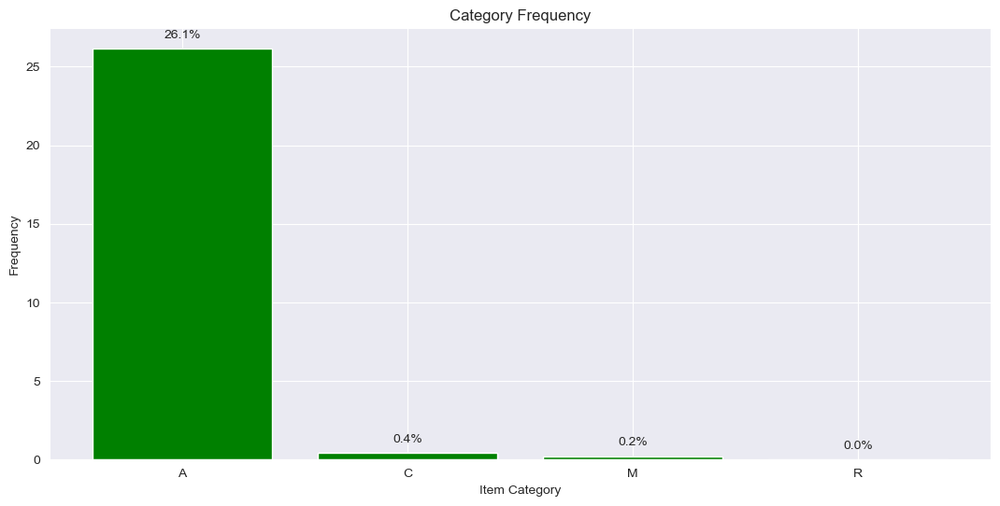

In [14]:
category_frequencies = (log_df.groupby('vehicleClass').size() / len(log_df)) * 100
plt.figure(figsize=(13, 6))
plt.bar(category_frequencies.index, category_frequencies.values, color='green')
plt.xlabel('Item Category')
plt.ylabel('Frequency')
plt.title('Category Frequency')
for i, v in enumerate(category_frequencies.values):
    plt.text(i, v + 0.5, f'{v:.1f}%', ha='center', va='bottom')
plt.show()

# **apply filter and noise removal**
he code filters an event log based on case performance criteria, specifically selecting cases with a duration between 60 seconds and 21 days, and assigns the filtered log to the variable filtered_log.

Number of cases: 71500


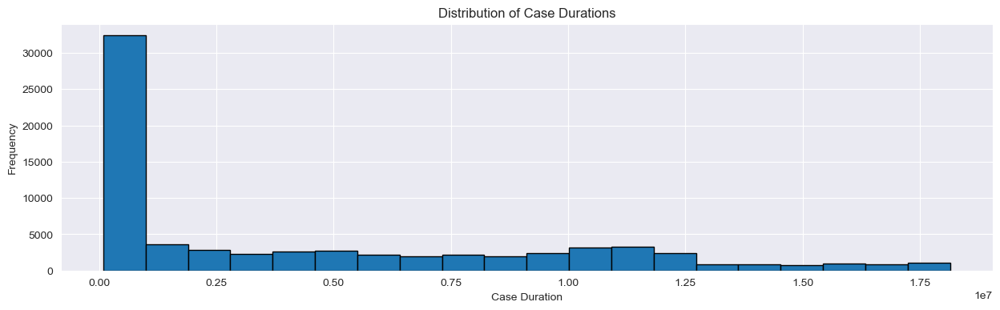

In [15]:
filtered_log = pm4py.filter_case_performance(log_df, 60, 18144000)
durations = pm4py.get_all_case_durations(filtered_log)
print("Number of cases:", len(durations))
plt.figure(figsize=(15, 4))
plt.hist(durations, bins=20, edgecolor='black')
plt.xlabel('Case Duration')
plt.ylabel('Frequency')
plt.title('Distribution of Case Durations')
plt.show()


Remaining Cases

In [16]:
k = 50
filtered_log = pm4py.filter_variants_top_k(filtered_log, k)
print("remaining cases:",len(pm4py.get_all_case_durations(filtered_log)))

remaining cases: 71477


# process discovery 

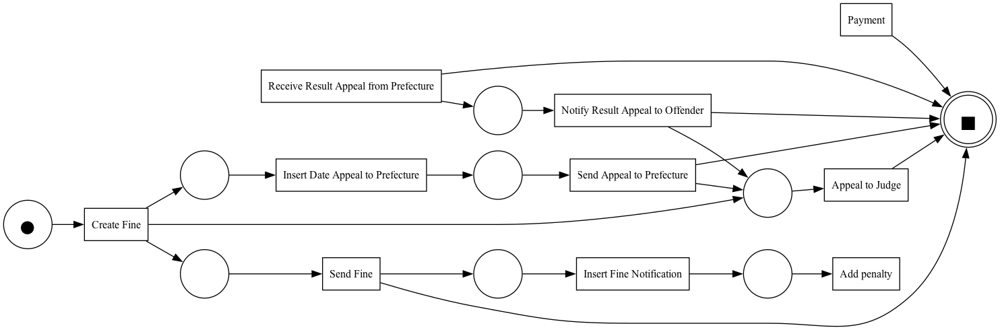

In [17]:
#alpha miner
net, initial_marking, final_marking = pm4py.discover_petri_net_alpha(filtered_log)
pm4py.view_petri_net(net, initial_marking, final_marking)

In [18]:
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
print("replay based fitness:",
      pm4py.fitness_token_based_replay(filtered_log, net, initial_marking, final_marking))

replaying log with TBR, completed traces ::   0%|          | 0/50 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.7246730821587704, 'log_fitness': 0.7311278532910253, 'percentage_of_fitting_traces': 0.0}


In [19]:
from pm4py.algo.evaluation.precision import algorithm as precision_evaluator
print("replay based precision:",pm4py.precision_token_based_replay(filtered_log, net, initial_marking, final_marking))

replaying log with TBR, completed traces ::   0%|          | 0/58 [00:00<?, ?it/s]

replay based precision: 0.5434155246373087


In [20]:
print("generalization:",generalization_evaluator.apply(filtered_log, net, initial_marking, final_marking))

replaying log with TBR, completed traces ::   0%|          | 0/50 [00:00<?, ?it/s]

generalization: 0.9528722733097428


In [21]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simp_alpha = simplicity_evaluator.apply(net)
print(simp_alpha)

0.7037037037037037


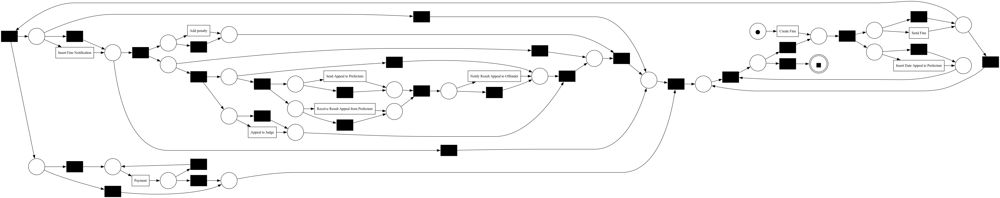

In [22]:
# inductive minder:
net, initial_marking, final_marking = pm4py.discover_petri_net_inductive(filtered_log)
pm4py.view_petri_net(net, initial_marking, final_marking)

In [23]:
from pm4py.algo.discovery.inductive import algorithm as inductive_miner

# Discover process model using inductive miner
model = inductive_miner.apply(filtered_log)


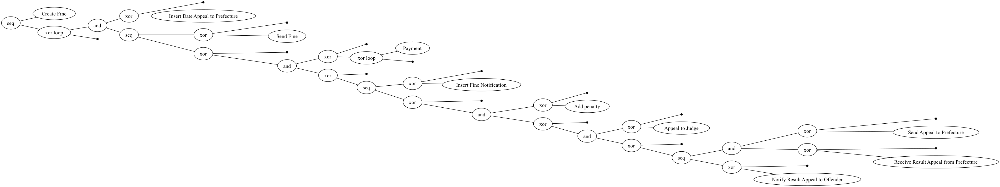

In [24]:
from pm4py.visualization.process_tree import visualizer as pt_visualizer
gviz = pt_visualizer.apply(model, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz)

replaying log with TBR, completed traces ::   0%|          | 0/50 [00:00<?, ?it/s]

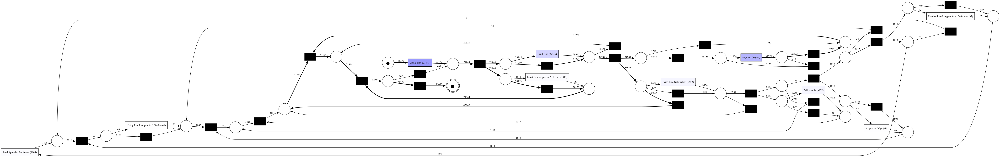

In [25]:
from pm4py.objects.conversion.process_tree import converter as pt_converter
net, initial_marking, final_marking = pt_converter.apply(model)
## Then visualise
gviz = pn_visualizer.apply(net, initial_marking, final_marking,
                           variant=pn_visualizer.Variants.FREQUENCY,
                           log=filtered_log)
pn_visualizer.view(gviz)

In [26]:
fitness_inductive = replay_fitness_evaluator.apply(filtered_log, net, initial_marking, final_marking, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
print(fitness_inductive)

replaying log with TBR, completed traces ::   0%|          | 0/50 [00:00<?, ?it/s]

{'perc_fit_traces': 99.99720189711375, 'average_trace_fitness': 0.9999991715420867, 'log_fitness': 0.9999970188922733, 'percentage_of_fitting_traces': 99.99720189711375}


In [27]:
prec_inductive = precision_evaluator.apply(filtered_log, net, initial_marking, final_marking, variant=precision_evaluator.Variants.ETCONFORMANCE_TOKEN)
print(prec_inductive)

replaying log with TBR, completed traces ::   0%|          | 0/58 [00:00<?, ?it/s]

0.5115746845781473


In [28]:
print("generalization:",generalization_evaluator.apply(filtered_log, net, initial_marking, final_marking))

replaying log with TBR, completed traces ::   0%|          | 0/50 [00:00<?, ?it/s]

generalization: 0.9260935254656915


In [29]:
simp_inductive = simplicity_evaluator.apply(net)
print(simp_inductive)

0.6296296296296295


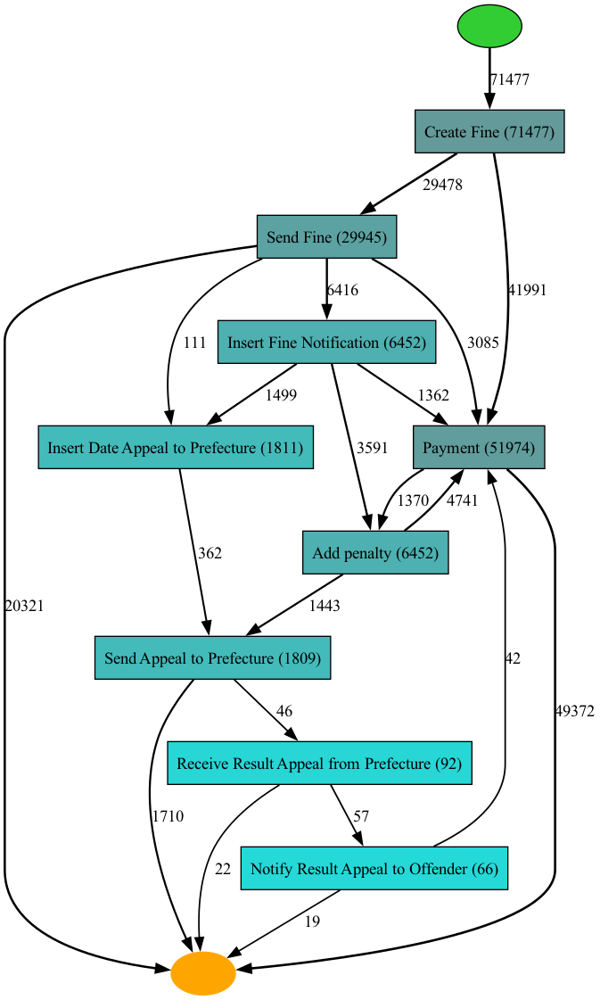

In [30]:
#Heuristic miner
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
net = heuristics_miner.apply_heu(filtered_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.9})
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer
gviz = hn_visualizer.apply(net)
hn_visualizer.view(gviz)

replaying log with TBR, completed traces ::   0%|          | 0/50 [00:00<?, ?it/s]

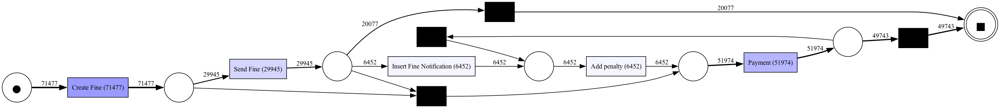

In [31]:
net, initial_marking, final_marking = heuristics_miner.apply(filtered_log, parameters={heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.9995})

gviz = pn_visualizer.apply(net, initial_marking, final_marking, variant=pn_visualizer.Variants.FREQUENCY, log=filtered_log)
pn_visualizer.view(gviz)

# Segmenting Data

In this section, we try to perform our analysis on subsection of log file. we divide log file into 4 categories and then perform above mentioned operations on each one.



In [32]:
def categorizeLogFile(log,categories):
  return {
        item: pm4py.filter_event_attribute_values(log_df, "vehicleClass", [item], level="case", retain=True)
        for item in categories
    }
segmentedData = categorizeLogFile(log_df,["A", "C","M", "R"])


In [33]:
log_df["concept:name"].value_counts()

concept:name
Create Fine                              150370
Send Fine                                103987
Insert Fine Notification                  79860
Add penalty                               79860
Payment                                   77601
Send for Credit Collection                59013
Insert Date Appeal to Prefecture           4188
Send Appeal to Prefecture                  4141
Receive Result Appeal from Prefecture       999
Notify Result Appeal to Offender            896
Appeal to Judge                             555
Name: count, dtype: int64

In [34]:
def filter(input):
  log = input.copy()
  log = pm4py.filter_case_performance(log, 60, 18144000)
  log = pm4py.filter_variants_top_k(log, k)
  log = pm4py.filter_start_activities(log,["Create Fine"])
  log = pm4py.filter_end_activities(log, [
  "Create Fine",
  "Send Fine",
  "Insert Fine Notification",
  "Add penalty",
  "Payment",
  "Send for Credit Collection",
  "Insert Date Appeal to Prefecture",
  "Send Appeal to Prefecture",
  "Receive Result Appeal from Prefecture",
  "Notify Result Appeal to Offender"])
  cases_to_exclude = pd.concat([
    pm4py.filter_activities_rework(log, "Send Fine", 2),
    pm4py.filter_activities_rework(log, "Insert Fine Notification", 2),
    pm4py.filter_activities_rework(log, "Add penalty", 2)
    ])
  cases_to_exclude = cases_to_exclude["case:concept:name"].unique()
  log = log[~log['case:concept:name'].isin(cases_to_exclude)]
  return log



In [35]:
for item in segmentedData:
  print("number of cases in",item," before filtering:", len(segmentedData[item]))
  segmentedData[item] = filter(segmentedData[item])
  print("number of cases in",item," after filtering:", len(segmentedData[item]))
  print("\n")


number of cases in A  before filtering: 545846
number of cases in A  after filtering: 165945


number of cases in C  before filtering: 10346
number of cases in C  after filtering: 2752


number of cases in M  before filtering: 5262
number of cases in M  after filtering: 1271


number of cases in R  before filtering: 16
number of cases in R  after filtering: 6



#**PlotCategories**

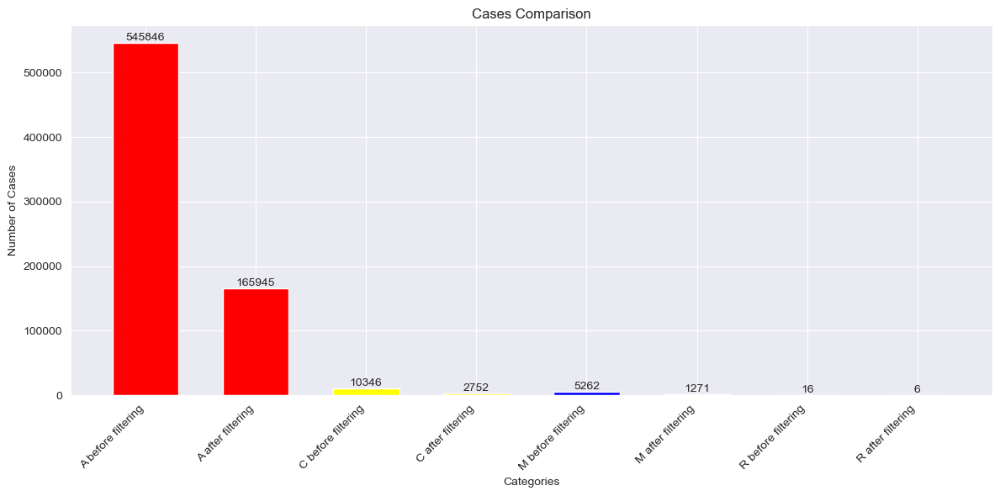

In [36]:
import matplotlib.pyplot as plt

categories = [
    'A before filtering',
    'A after filtering',
    'C before filtering',
    'C after filtering',
    'M before filtering',
    'M after filtering',
    'R before filtering',
    'R after filtering'
]
values = [545846, 165945, 10346, 2752, 5262, 1271, 16, 6]

colors = ['red', 'red', 'yellow', 'yellow', 'blue', 'blue', 'green', 'green']

fig, ax = plt.subplots(figsize=(12, 6))

bar_width = 0.6  # Adjust the width of the bars

bars = ax.bar(range(len(categories)), values, color=colors, width=bar_width)

for bar, value in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(value), ha='center', va='bottom')

ax.set_xlabel('Categories')
ax.set_ylabel('Number of Cases')
ax.set_title('Cases Comparison')

ax.set_xticks(range(len(categories)))
ax.set_xticklabels(categories, rotation=45, ha='right')

plt.tight_layout()  # Adjust the layout

plt.show()


In [37]:
#for the 3-way match, invoice after GR, it should contains "Record Goods Receipt" and also "Record Invoice Receipt"
segmentedData["A"] = pm4py.filter_activities_rework(segmentedData["A"], "Create Fine", 1)
segmentedData["A"] = pm4py.filter_activities_rework(segmentedData["A"], "Send Fine", 1)
print("size of \"A\" after filter:",len(segmentedData["A"]))

size of "A" after filter: 84055


In [38]:
#for the 3-way matching, invoice before goods receipt, it should contains "Record Goods Receipt"
segmentedData["C"] = pm4py.filter_activities_rework(segmentedData["C"], "Create Fine", 1)
print("size of \"C\" after filter:",len(segmentedData["C"]))

size of "C" after filter: 2752


In [39]:
for item in segmentedData:
  print(item)

A
C
M
R


A


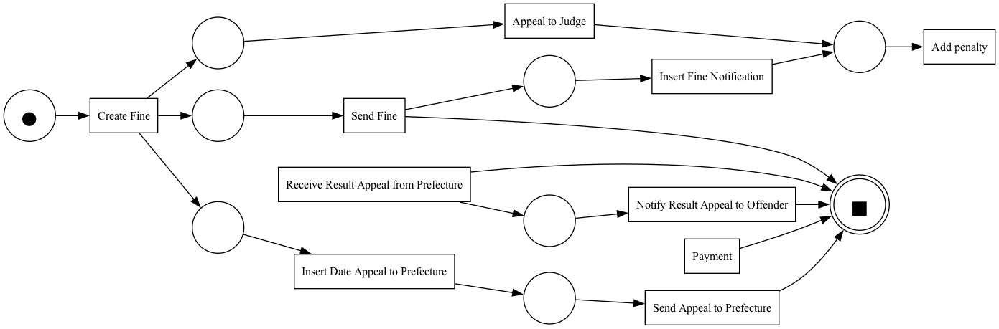

replaying log with TBR, completed traces ::   0%|          | 0/43 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/58 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/43 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.760761371843525, 'log_fitness': 0.7649858820261992, 'percentage_of_fitting_traces': 0.0}
replay based precision: 0.5344156743817301
generalization: 0.9290023346270082
simplicity: 0.826086956521739
C


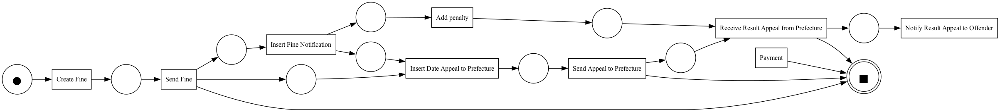

replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/21 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.809193637173514, 'log_fitness': 0.8010532976389506, 'percentage_of_fitting_traces': 0.0}
replay based precision: 0.6883910386965377
generalization: 0.8068765947417209
simplicity: 0.7692307692307694
M


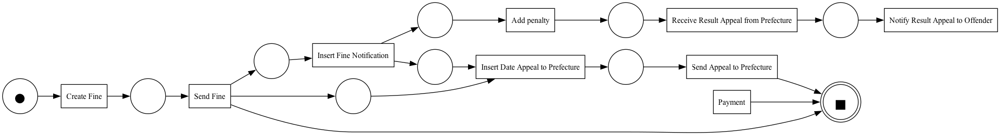

replaying log with TBR, completed traces ::   0%|          | 0/13 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/21 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/13 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.8097739965795537, 'log_fitness': 0.8061376890616851, 'percentage_of_fitting_traces': 0.0}
replay based precision: 0.6696468484577559
generalization: 0.6990945618639655
simplicity: 0.9047619047619049
R


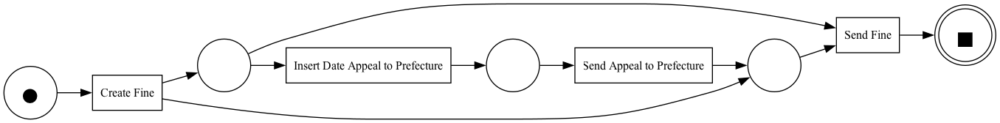

replaying log with TBR, completed traces ::   0%|          | 0/2 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/3 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/2 [00:00<?, ?it/s]

replay based fitness: {'perc_fit_traces': 50.0, 'average_trace_fitness': 0.9166666666666667, 'log_fitness': 0.9, 'percentage_of_fitting_traces': 50.0}
replay based precision: 1.0
generalization: 0.14644660940672627
simplicity: 0.8181818181818181


In [40]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
#alpha miner
alpha_miner_heatmap = {}
for item in segmentedData:
  print(item)
  net, initial_marking, final_marking = pm4py.discover_petri_net_alpha(segmentedData[item])
  pm4py.view_petri_net(net, initial_marking, final_marking)

  fitness = pm4py.fitness_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
  precision = pm4py.precision_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
  generalization = generalization_evaluator.apply(segmentedData[item], net, initial_marking, final_marking)
  simplicity = simplicity_evaluator.apply(net)

  alpha_miner_heatmap[item] = [fitness["log_fitness"],precision,generalization,simplicity]

  print("replay based fitness:", fitness)
  print("replay based precision:", precision)
  print("generalization:",generalization)
  print("simplicity:",simplicity)

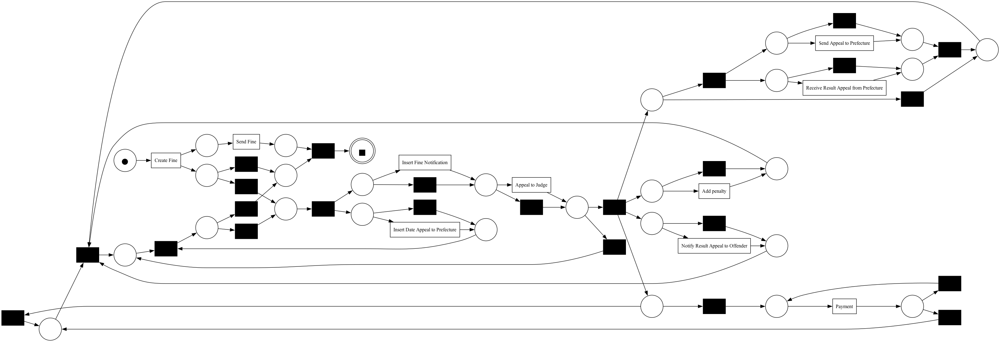

replaying log with TBR, completed traces ::   0%|          | 0/43 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/58 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/43 [00:00<?, ?it/s]

Item: A
Replay-based fitness: 1.0
Replay-based precision: 0.5019946171546112
Generalization: 0.925490928459501
Simplicity: 0.6326530612244898


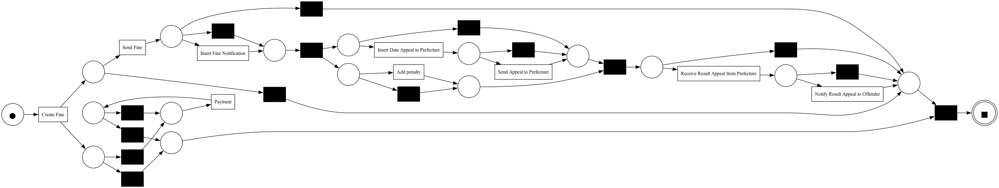

replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/21 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

Item: C
Replay-based fitness: 1.0
Replay-based precision: 0.8441280241935484
Generalization: 0.7959259164023372
Simplicity: 0.6507936507936508


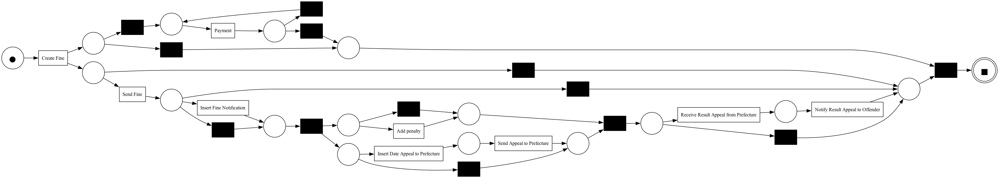

replaying log with TBR, completed traces ::   0%|          | 0/13 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/21 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/13 [00:00<?, ?it/s]

Item: M
Replay-based fitness: 1.0
Replay-based precision: 0.8442292171105731
Generalization: 0.7661197823578427
Simplicity: 0.6842105263157894


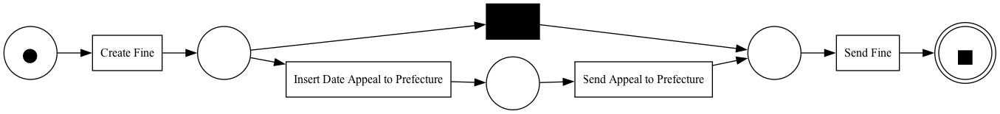

replaying log with TBR, completed traces ::   0%|          | 0/2 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/3 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/2 [00:00<?, ?it/s]

Item: R
Replay-based fitness: 1.0
Replay-based precision: 1.0
Generalization: 0.11715728752538102
Simplicity: 1.0


In [41]:
inductive_miner_heatmap = {}

for item in segmentedData:
    net, initial_marking, final_marking = pm4py.discover_petri_net_inductive(segmentedData[item])
    pm4py.view_petri_net(net, initial_marking, final_marking)

    fitness = pm4py.fitness_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
    precision = pm4py.precision_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
    generalization = generalization_evaluator.apply(segmentedData[item], net, initial_marking, final_marking)
    simplicity = simplicity_evaluator.apply(net)

    inductive_miner_heatmap[item] = [fitness["log_fitness"], precision, generalization, simplicity]

    print("Item:", item)
    print("Replay-based fitness:", fitness["log_fitness"])
    print("Replay-based precision:", precision)
    print("Generalization:", generalization)
    print("Simplicity:", simplicity)
    print()


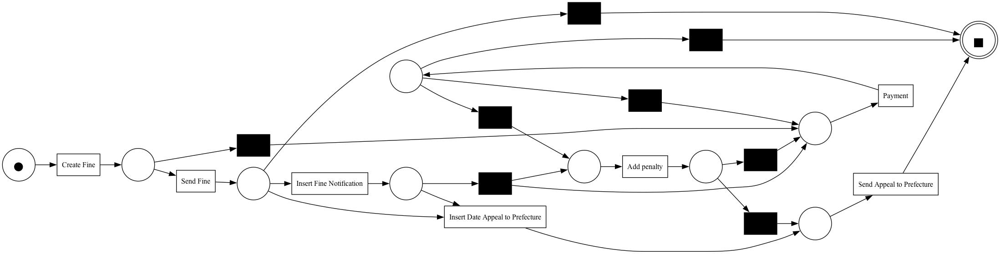

replaying log with TBR, completed traces ::   0%|          | 0/43 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/58 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/43 [00:00<?, ?it/s]

Item: A
Replay-based fitness: 0.9456263232203848
Replay-based precision: 0.9545715384058253
Generalization: 0.8882985580295102
Simplicity: 0.641025641025641


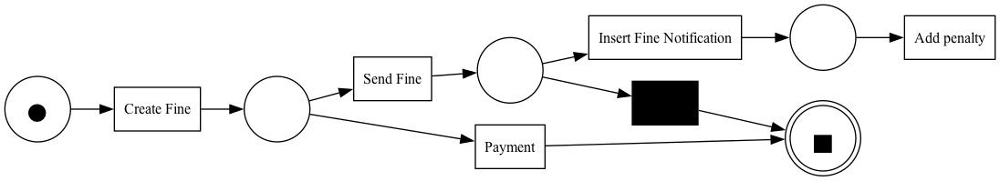

replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/21 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

Item: C
Replay-based fitness: 0.9442181447847637
Replay-based precision: 0.998659260678031
Generalization: 0.948071355201257
Simplicity: 1.0


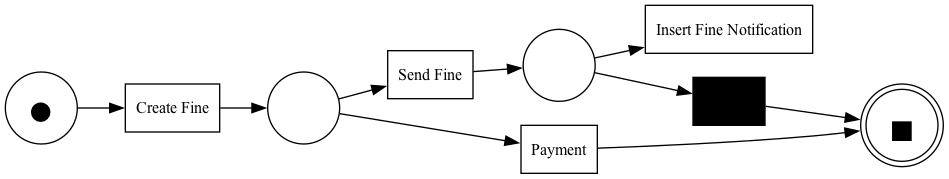

replaying log with TBR, completed traces ::   0%|          | 0/13 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/21 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/13 [00:00<?, ?it/s]

Item: M
Replay-based fitness: 0.9317044204482583
Replay-based precision: 0.9991216512955643
Generalization: 0.9297474656564998
Simplicity: 1.0


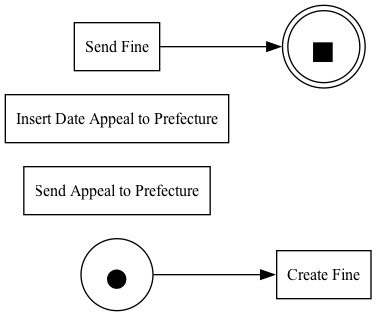

replaying log with TBR, completed traces ::   0%|          | 0/2 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/3 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/2 [00:00<?, ?it/s]

Item: R
Replay-based fitness: 1.0
Replay-based precision: 0.33333333333333337
Generalization: 0.14644660940672627
Simplicity: 1.0


In [42]:
heuristic_miner_heatmap = {}

for item in segmentedData:
    net, initial_marking, final_marking = pm4py.discover_petri_net_heuristics(
        segmentedData[item],
        dependency_threshold=0.99,
        and_threshold=0.99,
        loop_two_threshold=0.99
    )
    pm4py.view_petri_net(net, initial_marking, final_marking)

    fitness = pm4py.fitness_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
    precision = pm4py.precision_token_based_replay(segmentedData[item], net, initial_marking, final_marking)
    generalization = generalization_evaluator.apply(segmentedData[item], net, initial_marking, final_marking)
    simplicity = simplicity_evaluator.apply(net)

    heuristic_miner_heatmap[item] = [fitness["log_fitness"], precision, generalization, simplicity]

    print("Item:", item)
    print("Replay-based fitness:", fitness["log_fitness"])
    print("Replay-based precision:", precision)
    print("Generalization:", generalization)
    print("Simplicity:", simplicity)
    print()


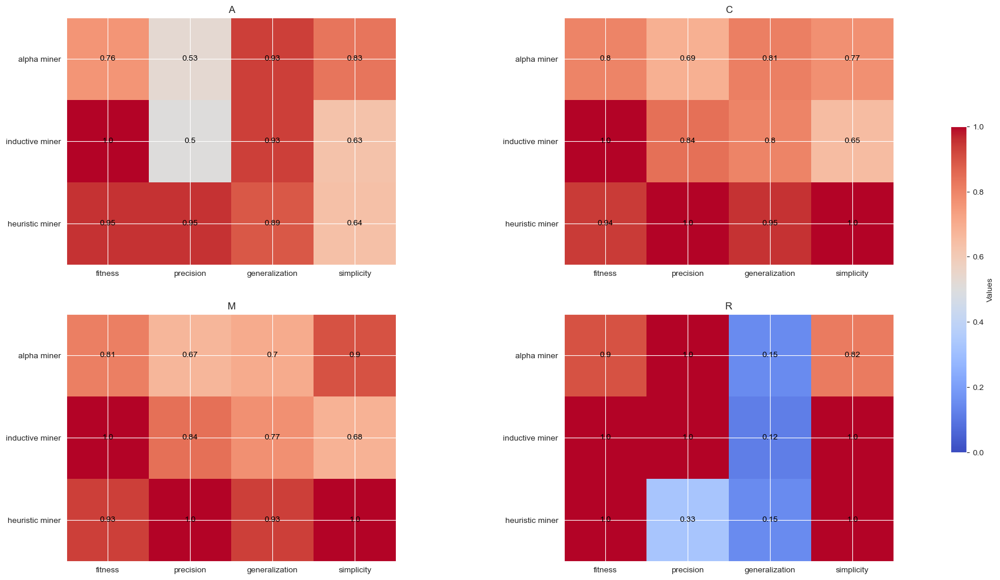

In [43]:
import numpy as np
import matplotlib.pyplot as plt

x_labels = ["fitness", "precision", "generalization", "simplicity"]
y_labels = ["alpha miner", "inductive miner", "heuristic miner"]

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 12))

for i, key in enumerate(alpha_miner_heatmap.keys()):
    row = i // 2
    col = i % 2
    values = np.array([
        alpha_miner_heatmap[key],
        inductive_miner_heatmap[key],
        heuristic_miner_heatmap[key]
    ])
    values = np.round(values, decimals=2)
    ax = axes[row, col]
    im = ax.imshow(values, cmap='coolwarm', vmin=0, vmax=1)  # Change the colormap to 'coolwarm'
    ax.set_title(key)
    ax.set_xticks(np.arange(len(x_labels)))
    ax.set_xticklabels(x_labels)
    ax.set_yticks(np.arange(len(y_labels)))
    ax.set_yticklabels(y_labels)
    for i in range(len(y_labels)):
        for j in range(len(x_labels)):
            text = ax.text(j, i, values[i, j], ha="center", va="center", color="black")

cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.6)
cbar.ax.set_ylabel('Values')

plt.show()


In [44]:
log_df

,amount,org:resource,dismissal,concept:name,vehicleClass,totalPaymentAmount,lifecycle:transition,time:timestamp,article,points,case:concept:name,expense,notificationType,lastSent,paymentAmount,matricola
0,35.0,561,NIL,Create Fine,A,0.0,complete,2006-07-24 00:00:00+00:00,157.0,0.0,A1,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,Send Fine,NaN,NaN,complete,2006-12-05 00:00:00+00:00,NaN,NaN,A1,11.00,NaN,NaN,NaN,NaN
2,35.0,561,NIL,Create Fine,A,0.0,complete,2006-08-02 00:00:00+00:00,157.0,0.0,A100,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,Send Fine,NaN,NaN,complete,2006-12-12 00:00:00+00:00,NaN,NaN,A100,11.00,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,Insert Fine Notification,NaN,NaN,complete,2007-01-15 00:00:00+00:00,NaN,NaN,A100,NaN,P,P,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561465,131.0,25,NIL,Create Fine,A,0.0,complete,2002-09-07 00:00:00+00:00,142.0,0.0,V9999,NaN,NaN,NaN,NaN,NaN
561466,NaN,NaN,NaN,Send Fine,NaN,NaN,complete,2002-10-25 00:00:00+00:00,NaN,NaN,V9999,15.16,NaN,NaN,NaN,NaN
561467,NaN,NaN,NaN,Insert Fine Notification,NaN,NaN,complete,2002-11-04 00:00:00+00:00,NaN,NaN,V9999,NaN,P,N,NaN,NaN
561468,262.0,NaN,NaN,Add penalty,NaN,NaN,complete,2003-01-03 00:00:00+00:00,NaN,NaN,V9999,NaN,NaN,NaN,NaN,NaN


#**Clustering**


In [45]:
from sklearn.cluster import KMeans
from sklearn import preprocessing

In [46]:
#Extract the features and encode them into onehot encoding vector
features_df = pm4py.extract_features_dataframe(log_df, str_ev_attr = ['concept:name', 'amount', 'paymentAmount'])
features_df = features_df .fillna(0)

In [47]:
log_df

,amount,org:resource,dismissal,concept:name,vehicleClass,totalPaymentAmount,lifecycle:transition,time:timestamp,article,points,case:concept:name,expense,notificationType,lastSent,paymentAmount,matricola
0,35.0,561,NIL,Create Fine,A,0.0,complete,2006-07-24 00:00:00+00:00,157.0,0.0,A1,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,Send Fine,NaN,NaN,complete,2006-12-05 00:00:00+00:00,NaN,NaN,A1,11.00,NaN,NaN,NaN,NaN
2,35.0,561,NIL,Create Fine,A,0.0,complete,2006-08-02 00:00:00+00:00,157.0,0.0,A100,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,Send Fine,NaN,NaN,complete,2006-12-12 00:00:00+00:00,NaN,NaN,A100,11.00,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,Insert Fine Notification,NaN,NaN,complete,2007-01-15 00:00:00+00:00,NaN,NaN,A100,NaN,P,P,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561465,131.0,25,NIL,Create Fine,A,0.0,complete,2002-09-07 00:00:00+00:00,142.0,0.0,V9999,NaN,NaN,NaN,NaN,NaN
561466,NaN,NaN,NaN,Send Fine,NaN,NaN,complete,2002-10-25 00:00:00+00:00,NaN,NaN,V9999,15.16,NaN,NaN,NaN,NaN
561467,NaN,NaN,NaN,Insert Fine Notification,NaN,NaN,complete,2002-11-04 00:00:00+00:00,NaN,NaN,V9999,NaN,P,N,NaN,NaN
561468,262.0,NaN,NaN,Add penalty,NaN,NaN,complete,2003-01-03 00:00:00+00:00,NaN,NaN,V9999,NaN,NaN,NaN,NaN,NaN


In [48]:
column_names = features_df.columns.values.tolist() #get the list of all column names from headers
x = features_df.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler() #normilising with MinMaxScaler #be careful because when a value is always 1 the min max produce 0
x_scaled = min_max_scaler.fit_transform(x)
norm_df = pd.DataFrame(x_scaled)
norm_df.columns = column_names # adding column name to the respective columns


norm_df

,concept:name_CreateFine,concept:name_SendFine,concept:name_InsertFineNotification,concept:name_Addpenalty,concept:name_SendforCreditCollection,concept:name_Payment,concept:name_InsertDateAppealtoPrefecture,concept:name_SendAppealtoPrefecture,concept:name_ReceiveResultAppealfromPrefecture,concept:name_NotifyResultAppealtoOffender,concept:name_AppealtoJudge,paymentAmount,amount
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.004375
1,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.008938
2,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.021887,0.009250
3,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.000000,0.009250
4,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.009250
...,...,...,...,...,...,...,...,...,...,...,...,...,...
150365,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.032750
150366,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.036770,0.016375
150367,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.032750
150368,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.032750


#initialize kmeans parameters


In [49]:
kmeans_kwargs = {
"init": "random",
"n_init": 10,
"random_state": None,
}

#create list to hold SSE (sum of squared errors) values for each k


In [50]:
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(norm_df)
    sse.append(kmeans.inertia_)


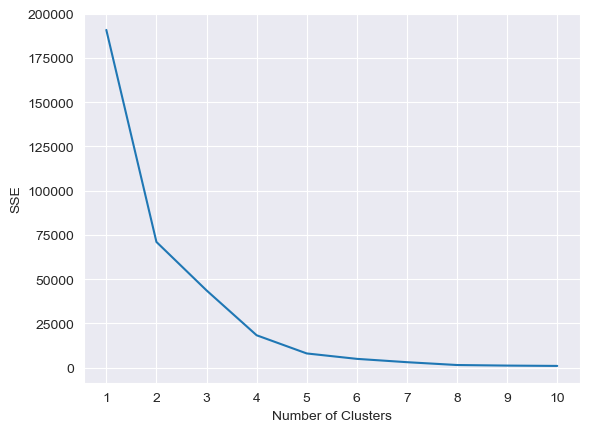

In [51]:
#visualize results
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [52]:
#instantiate the k-means class, using optimal number of clusters
kmeans = KMeans(init="random", n_clusters=3, n_init=10, random_state=1)

#fit k-means algorithm to data
kmeans.fit(norm_df)

#view cluster assignments for each observation
kmeans.labels_

array([0, 2, 2, ..., 2, 2, 2], dtype=int32)

In [53]:
#append cluster assingments to original DataFrame
features_df['cluster'] = kmeans.labels_

#view updated DataFrame
features_df

,concept:name_CreateFine,concept:name_SendFine,concept:name_InsertFineNotification,concept:name_Addpenalty,concept:name_SendforCreditCollection,concept:name_Payment,concept:name_InsertDateAppealtoPrefecture,concept:name_SendAppealtoPrefecture,concept:name_ReceiveResultAppealfromPrefecture,concept:name_NotifyResultAppealtoOffender,concept:name_AppealtoJudge,paymentAmount,amount,cluster
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,35.0,0
1,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,71.5,2
2,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,87.000000,74.0,2
3,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.000000,74.0,2
4,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,74.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150365,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,262.0,2
150366,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,146.160004,131.0,0
150367,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,262.0,2
150368,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,262.0,2


In [54]:
features_df['case:concept:name']=log_df['case:concept:name']
# get the list of cases having 0 as a value of column cluster 
cluster1_cases = features_df[features_df['cluster'] == 0]['case:concept:name'].tolist()
cluster1_cases

['A1',
 'A10001',
 'A10008',
 'A10008',
 'A10009',
 'A10011',
 'A10011',
 'A10011',
 'A10015',
 'A10019',
 'A1002',
 'A10021',
 'A10021',
 'A10022',
 'A10034',
 'A10034',
 'A10042',
 'A10042',
 'A10043',
 'A10043',
 'A10043',
 'A10044',
 'A10044',
 'A10050',
 'A10056',
 'A10056',
 'A1006',
 'A10061',
 'A10063',
 'A10063',
 'A10067',
 'A10067',
 'A10067',
 'A10068',
 'A10069',
 'A10069',
 'A10071',
 'A10072',
 'A10077',
 'A10085',
 'A10089',
 'A1009',
 'A10090',
 'A10095',
 'A10099',
 'A10101',
 'A10101',
 'A10101',
 'A10102',
 'A10106',
 'A10106',
 'A10107',
 'A10107',
 'A10108',
 'A10115',
 'A10115',
 'A10115',
 'A10117',
 'A10118',
 'A10122',
 'A10122',
 'A10124',
 'A10124',
 'A10126',
 'A10127',
 'A1013',
 'A10130',
 'A10130',
 'A10130',
 'A10131',
 'A10137',
 'A10139',
 'A10140',
 'A10140',
 'A10141',
 'A10141',
 'A10144',
 'A10147',
 'A10150',
 'A10151',
 'A10152',
 'A10152',
 'A10152',
 'A10153',
 'A10153',
 'A1016',
 'A10164',
 'A10164',
 'A10165',
 'A10165',
 'A10165',
 'A10168

In [55]:
cluster1_log = filtered_log[filtered_log['case:concept:name'].isin(cluster1_cases)]


In [56]:
num_events = len(cluster1_log)
num_cases = len(cluster1_log['case:concept:name'].unique())
print("Number of events: {}\nNumber of cases: {}".format(num_events, num_cases))


Number of events: 14903
Number of cases: 5588


In [57]:
cluster2_cases = features_df[features_df['cluster'] == 1]['case:concept:name'].tolist()
# selecting rows based on condition 
cluster2_log = filtered_log[filtered_log['case:concept:name'].isin(cluster2_cases)]

num_events = len(cluster2_log)
num_cases = len(cluster2_log['case:concept:name'].unique())
print("Number of events: {}\nNumber of cases: {}".format(num_events, num_cases))


Number of events: 23517
Number of cases: 9111


In [58]:
cluster3_cases = features_df[features_df['cluster'] == 2]['case:concept:name'].tolist()
# selecting rows based on condition 
cluster3_log = filtered_log[filtered_log['case:concept:name'].isin(cluster3_cases)]

num_events = len(cluster3_log)
num_cases = len(cluster3_log['case:concept:name'].unique())
print("Number of events: {}\nNumber of cases: {}".format(num_events, num_cases))


Number of events: 33899
Number of cases: 13840


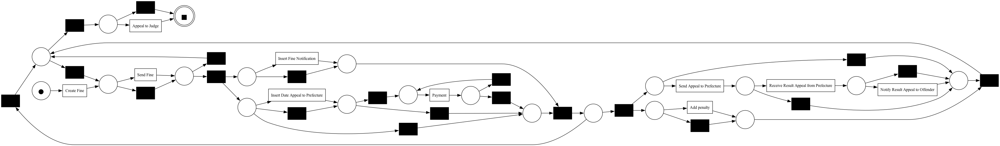

In [59]:
# create and visualize the petri net on clsuter1 using inductive miner
net, im, fm = pm4py.discover_petri_net_inductive(cluster1_log)
pm4py.view_petri_net(net, im, fm, format='png')


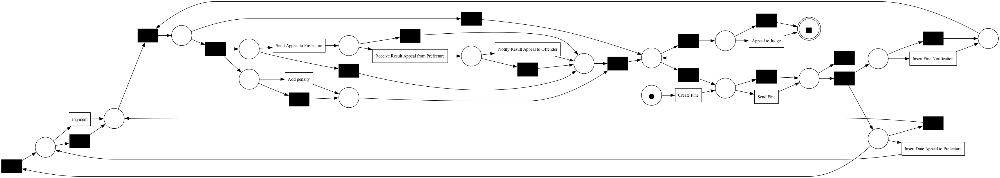

In [60]:
# create and visualize the petri net on clsuter2 using inductive miner
net, im, fm = pm4py.discover_petri_net_inductive(cluster2_log)
pm4py.view_petri_net(net, im, fm, format='png')


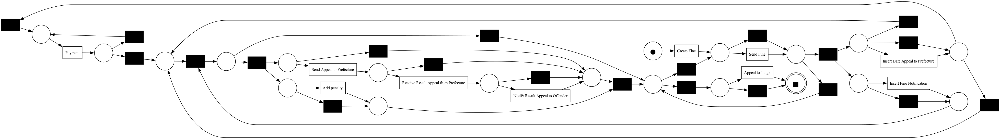

In [61]:
# create and visualize the petri net on clsuter3 using inductive miner
net, im, fm = pm4py.discover_petri_net_inductive(cluster3_log)
pm4py.view_petri_net(net, im, fm, format='png')


#**DecisionTree**

In [62]:
#split dataset in features and target variable
feature_cols =  [x for x in column_names if x != "concept:name_Payment"]
feature_cols =  [x for x in feature_cols if x != "paymentAmount"]
print(feature_cols)

['concept:name_CreateFine', 'concept:name_SendFine', 'concept:name_InsertFineNotification', 'concept:name_Addpenalty', 'concept:name_SendforCreditCollection', 'concept:name_InsertDateAppealtoPrefecture', 'concept:name_SendAppealtoPrefecture', 'concept:name_ReceiveResultAppealfromPrefecture', 'concept:name_NotifyResultAppealtoOffender', 'concept:name_AppealtoJudge', 'amount']


In [63]:
X = norm_df[feature_cols] # Features, can be numerical or categorical
y = norm_df['concept:name_Payment'] # Target variable, must be categorical

In [64]:
from sklearn.model_selection import train_test_split
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test#


In [65]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)


In [66]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.9598989160071822


In [67]:
from six import StringIO 
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('BisRoad.png')
Image(graph.create_png())


In [68]:
#Extracts a dataframe containing the temporal features of the provided log object
temporal_features_df = pm4py.extract_temporal_features_dataframe(filtered_log, grouper_freq = 'M')

temporal_features_df


,timestamp,unique_resources,unique_cases,unique_activities,num_events,average_arrival_rate,average_finish_rate,average_waiting_time,average_sojourn_time,average_service_time
0,2000-01-31 00:00:00+00:00,23,270,3,396,8960.000000,19520.000000,3.970240e+06,3.970240e+06,0.0
1,2000-02-29 00:00:00+00:00,22,315,4,421,10971.428571,17828.571429,4.643383e+06,4.643383e+06,0.0
2,2000-03-31 00:00:00+00:00,24,524,6,723,7254.961832,15993.893130,5.517893e+06,5.517893e+06,0.0
3,2000-04-30 00:00:00+00:00,25,471,7,617,9171.974522,14308.280255,7.351704e+06,7.351704e+06,0.0
4,2000-05-31 00:00:00+00:00,42,607,7,800,9252.059308,14376.276771,8.044737e+06,8.044737e+06,0.0
...,...,...,...,...,...,...,...,...,...,...
157,2013-02-28 00:00:00+00:00,21,365,8,501,16096.438356,14676.164384,9.593477e+06,9.593477e+06,0.0
158,2013-03-31 00:00:00+00:00,35,397,9,493,12405.037783,9575.818640,6.913523e+06,6.913523e+06,0.0
159,2013-04-30 00:00:00+00:00,46,486,8,556,10844.444444,7822.222222,5.009600e+06,5.009600e+06,0.0
160,2013-05-31 00:00:00+00:00,45,801,8,975,8413.483146,4206.741573,3.282445e+06,3.282445e+06,0.0
